In [1]:
!pip install kaggle tensorflow tensorflow_hub matplotlib
!pip install --upgrade tensorflow tensorflow_hub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 98.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 87.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 101.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 67.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 36.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 1.3 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.9.0
    Uninstalling h5py-3.9.0:
      Successfully uninstalled h5py-3.9.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.15.0
    Uninstalling tensorflow-2.15.0:
      

In [2]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))


Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 64 bytes


In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [4]:
!kaggle datasets download -d emmarex/plantdisease

# Unzip the dataset
!unzip plantdisease.zip -d PlantDisease


Streaming output truncated to the last 5000 lines.
  inflating: PlantDisease/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08c033bd-fbc3-445a-88d1-1863070e52ce___YLCV_GCREC 2872.JPG  
  inflating: PlantDisease/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08dd176c-e9d9-4746-92c3-fa8dc9074347___UF.GRC_YLCV_Lab 03057.JPG  
  inflating: PlantDisease/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/08f78a80-46f5-45a6-937c-4d05d61c08c2___UF.GRC_YLCV_Lab 01895.JPG  
  inflating: PlantDisease/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0903aa95-6e8a-4abd-a003-126fcd9a5493___YLCV_GCREC 2806.JPG  
  inflating: PlantDisease/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/0911d416-d73d-4c2a-8e45-207a7ceb7c9a___YLCV_GCREC 2773.JPG  
  inflating: PlantDisease/plantvillage/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus/09188838-cc89-4925-94c5-d9563c4cb4bf___UF.GRC_YLCV_Lab 02974.JPG  
  inflating: PlantDisease

In [16]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import random
import cv2
import os
import PIL
import pathlib
# import splitfolders
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import TensorBoard
import tensorflow_hub as hub
from sklearn.metrics import classification_report, confusion_matrix

from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model

# Load dataset
ds_train = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/PlantDisease/PlantVillage',
    labels='inferred',
    label_mode='int',
    color_mode='rgb',
    batch_size=32,
    image_size=(224, 224),
    shuffle=True,
    seed=42
)

# Preprocess dataset
def preprocess_data(image, label):
    image = image / 255.0  # Normalize image
    return image, label

ds_train = ds_train.map(preprocess_data).prefetch(tf.data.AUTOTUNE)


Found 20638 files belonging to 15 classes.


In [6]:
# Count the number of unique labels in the training dataset
unique_labels = set()
for _, labels in ds_train:
    unique_labels.update(labels.numpy())

#checking number of classes
num_classes = len(unique_labels)
print(f"Number of classes: {num_classes}")


Number of classes: 15


Original Image (Label: 2):


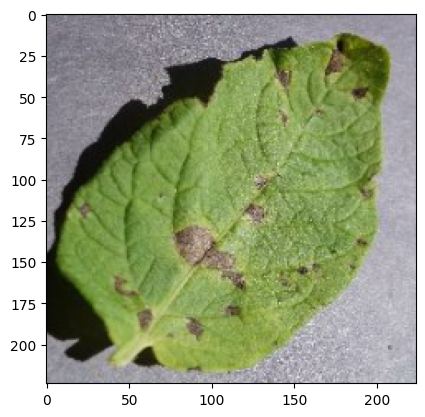

Augmented Image:


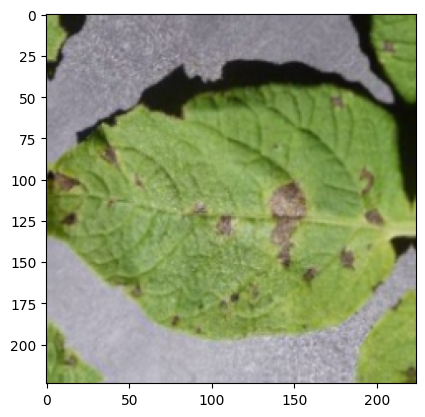

Original Image (Label: 10):


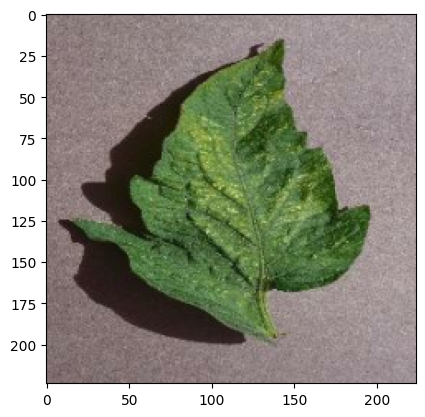

Augmented Image:


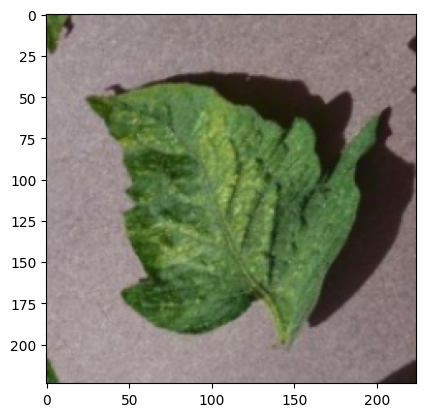

Original Image (Label: 5):


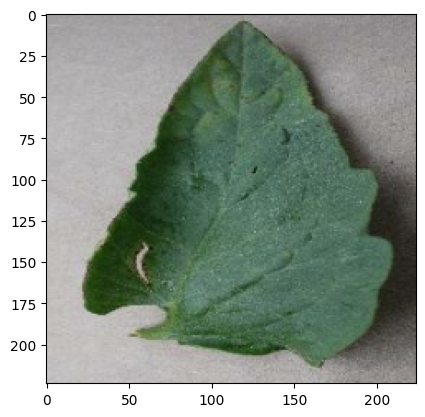

Augmented Image:


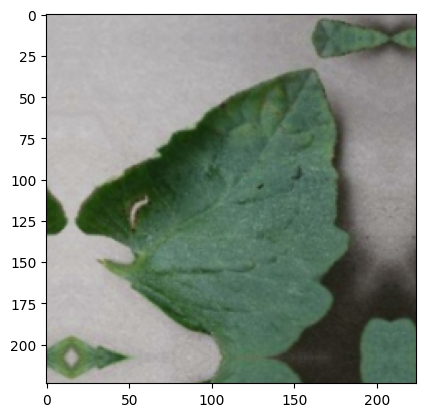

Original Image (Label: 5):


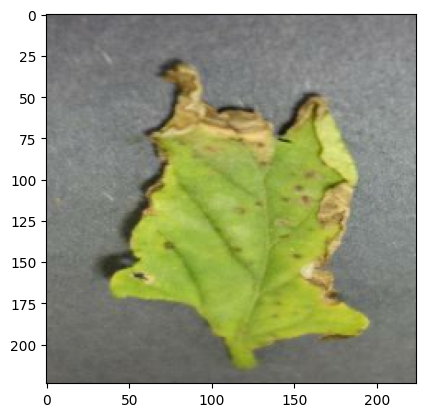

Augmented Image:


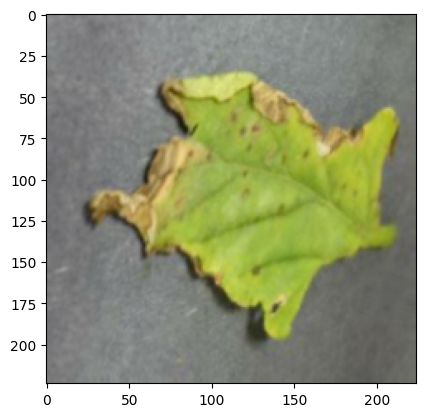

Original Image (Label: 6):


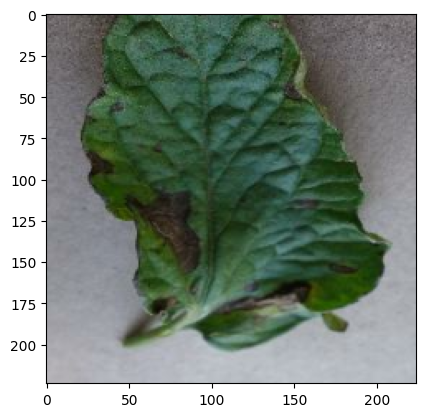

Augmented Image:


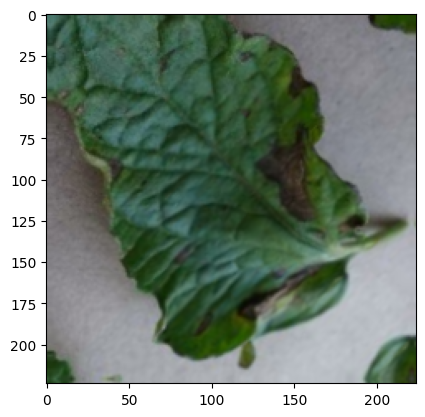

Original Image (Label: 12):


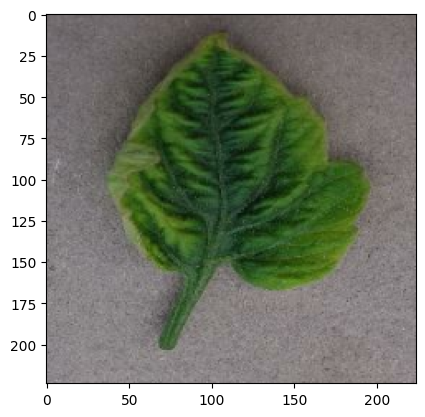

Augmented Image:


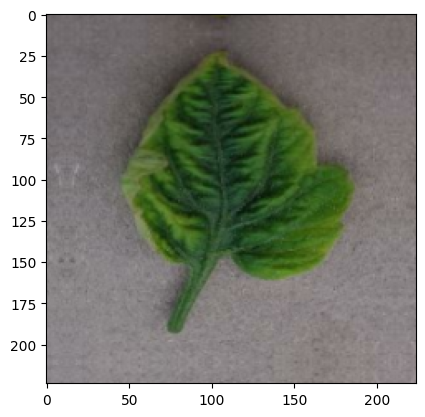

Original Image (Label: 2):


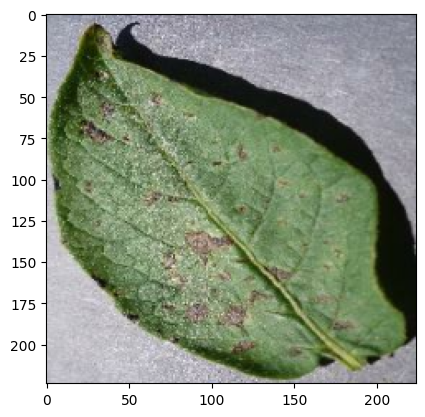

Augmented Image:


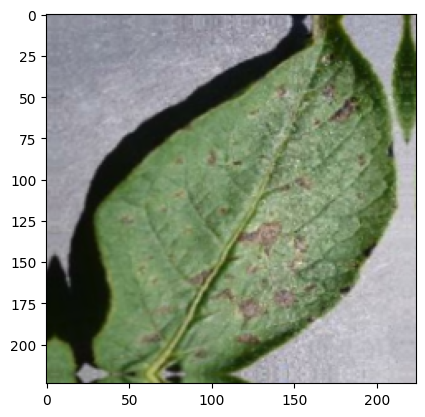

Original Image (Label: 12):


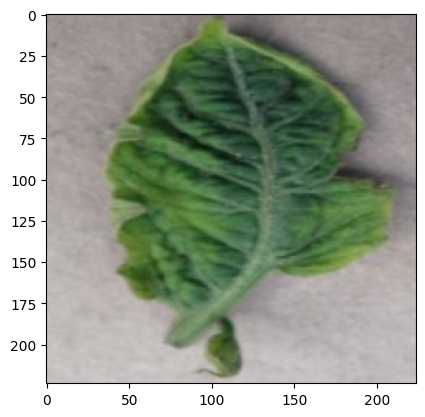

Augmented Image:


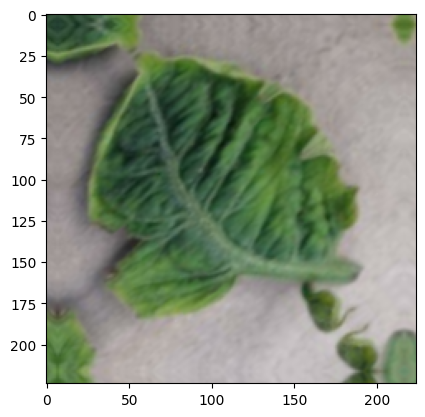

Original Image (Label: 9):


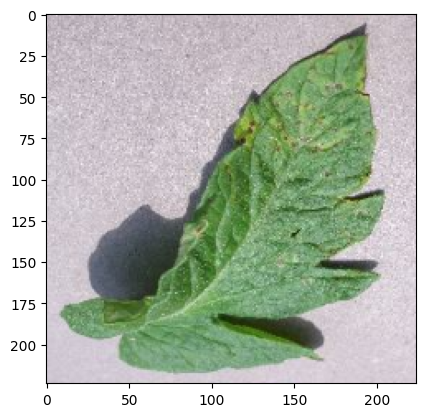

Augmented Image:


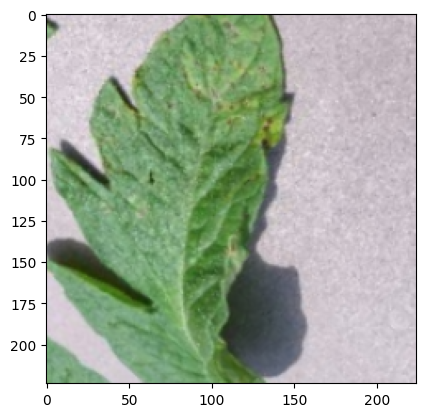

Original Image (Label: 7):


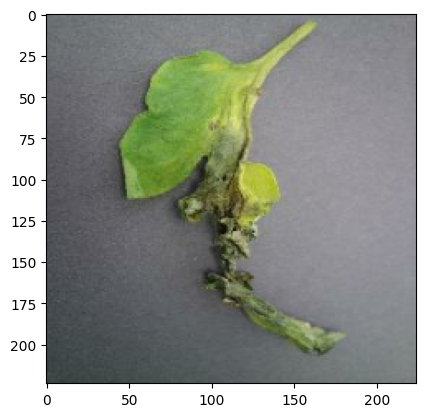

Augmented Image:


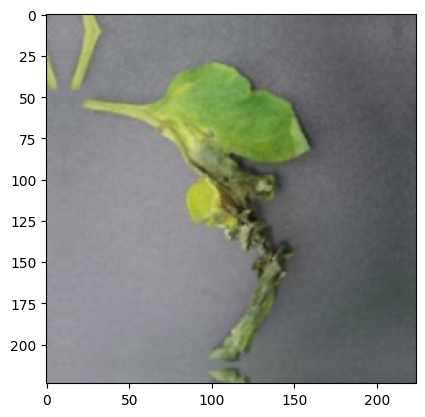

Original Image (Label: 14):


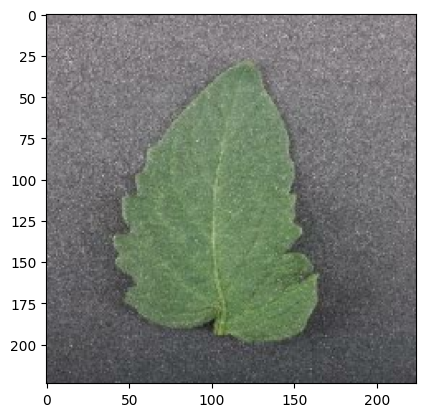

Augmented Image:


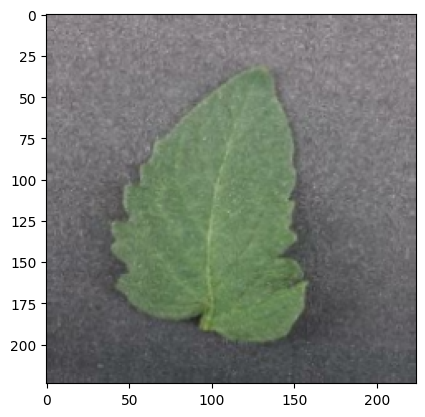

Original Image (Label: 0):


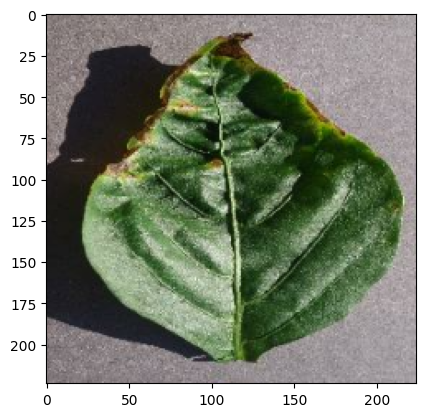

Augmented Image:


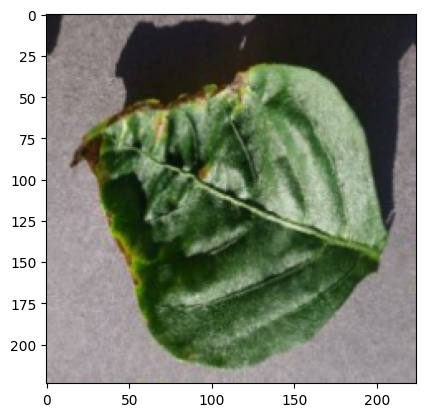

Original Image (Label: 13):


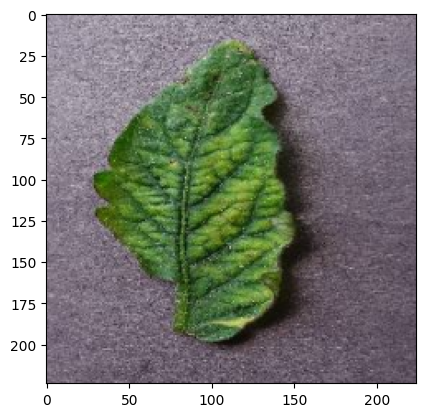

Augmented Image:


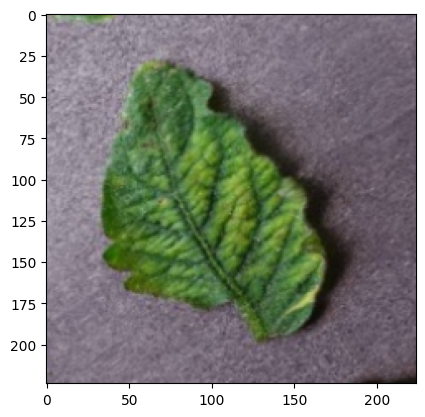

Original Image (Label: 0):


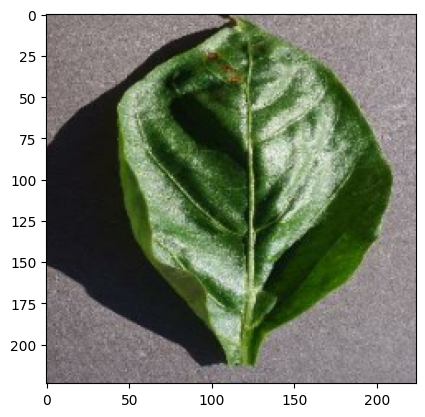

Augmented Image:


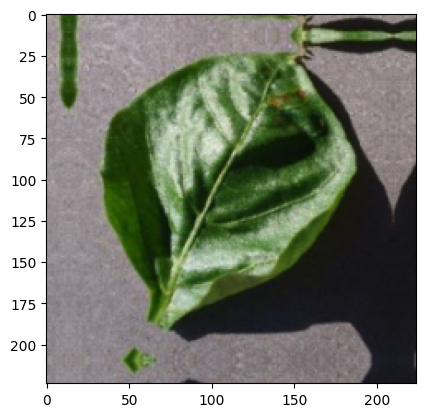

Original Image (Label: 5):


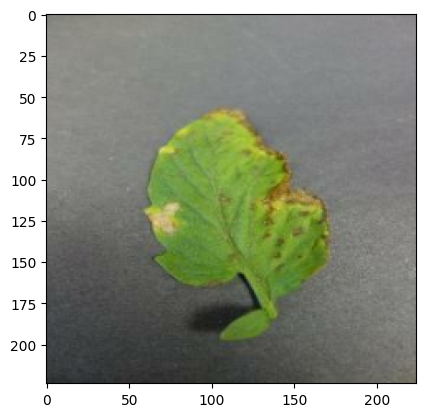

Augmented Image:


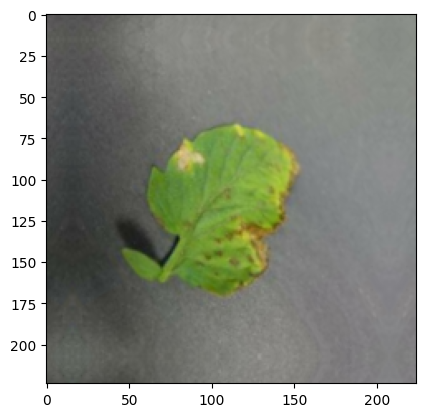

Original Image (Label: 10):


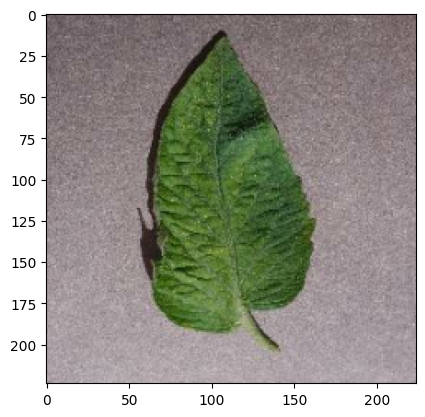

Augmented Image:


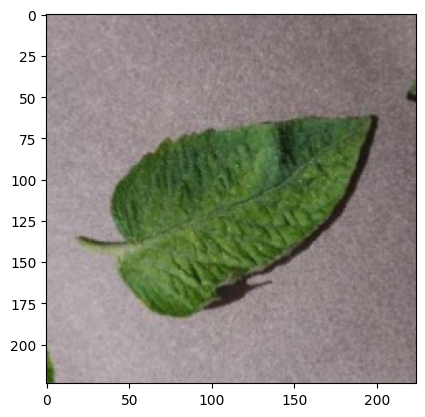

Original Image (Label: 11):


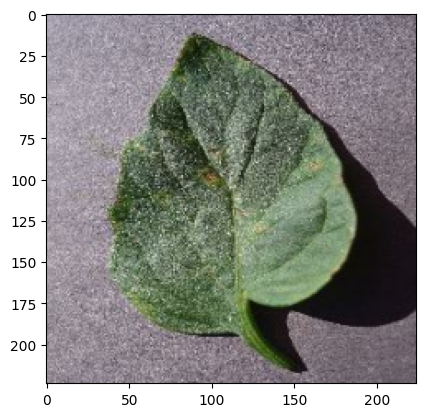

Augmented Image:


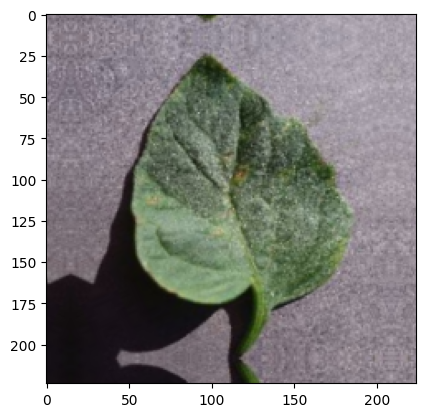

Original Image (Label: 12):


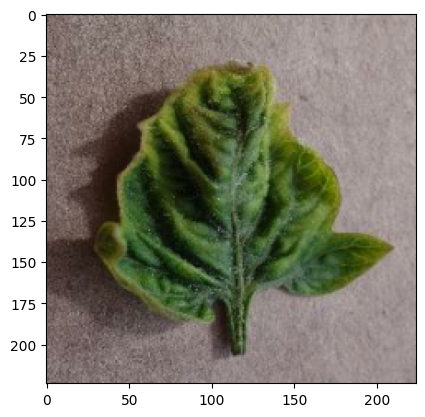

Augmented Image:


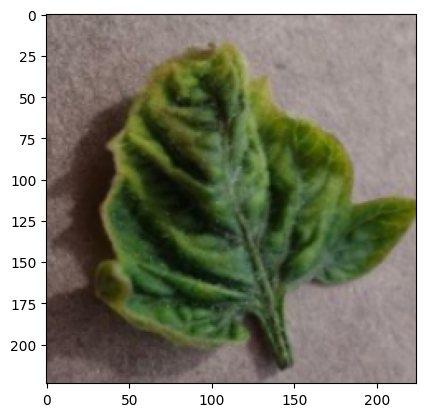

Original Image (Label: 11):


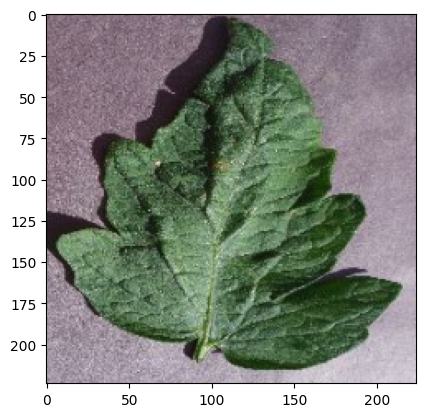

Augmented Image:


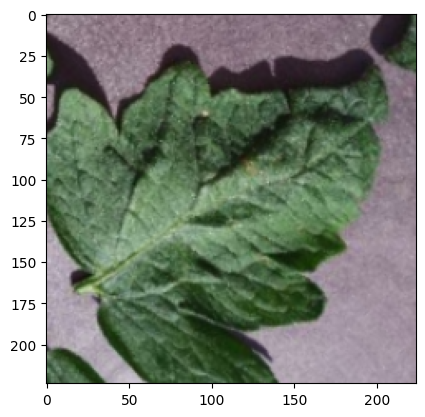

Original Image (Label: 3):


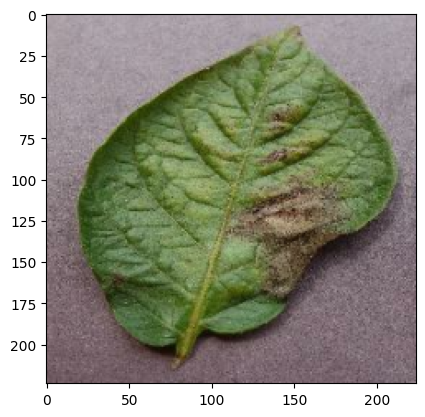

Augmented Image:


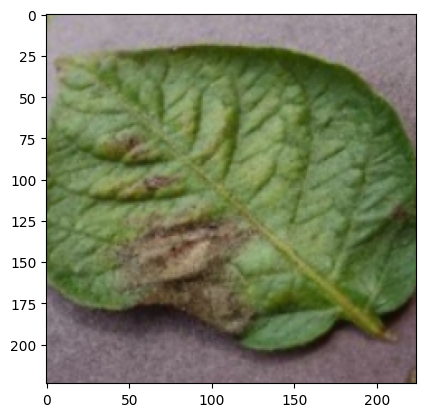

Original Image (Label: 10):


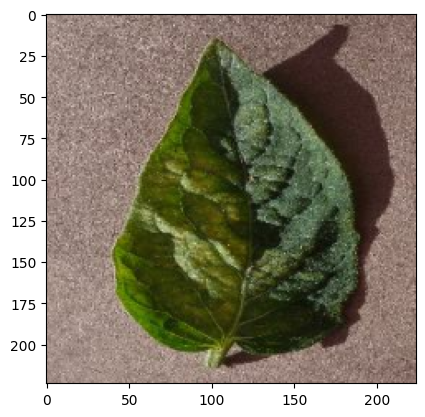

Augmented Image:


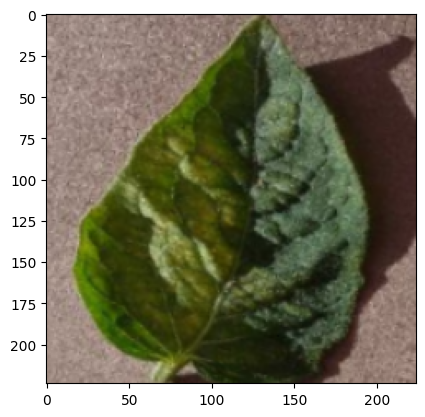

Original Image (Label: 12):


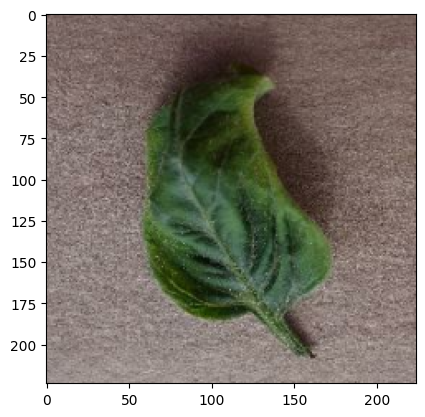

Augmented Image:


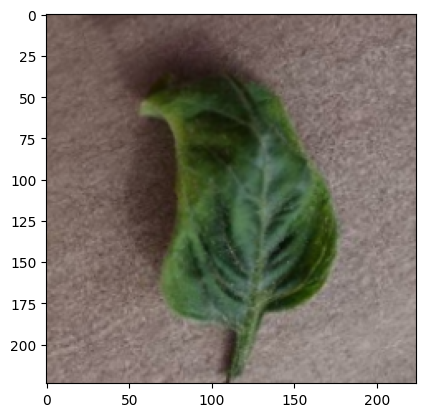

Original Image (Label: 1):


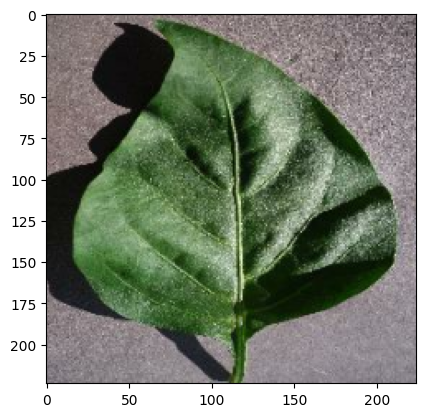

Augmented Image:


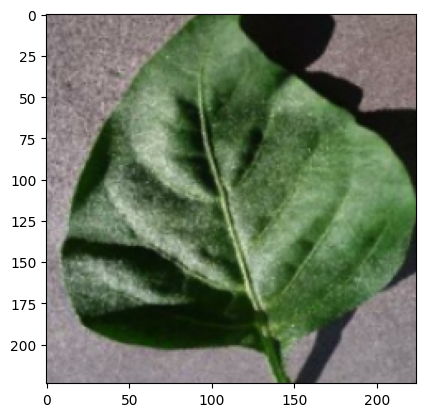

Original Image (Label: 3):


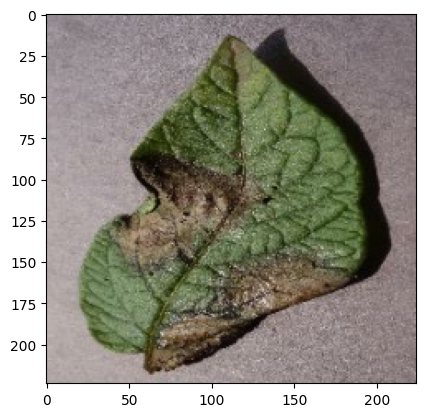

Augmented Image:


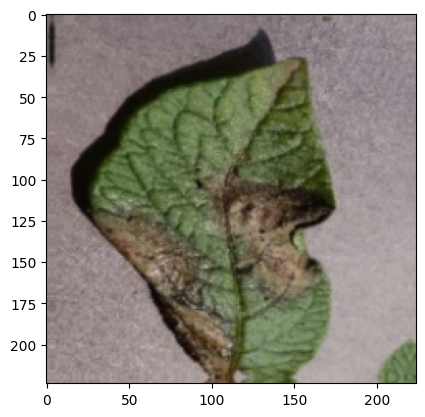

Original Image (Label: 11):


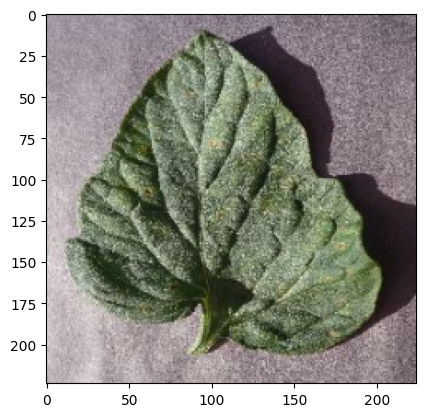

Augmented Image:


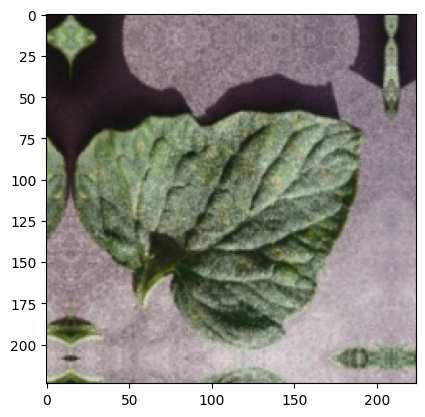

Original Image (Label: 14):


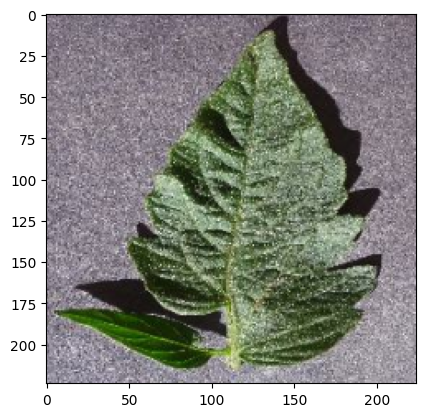

Augmented Image:


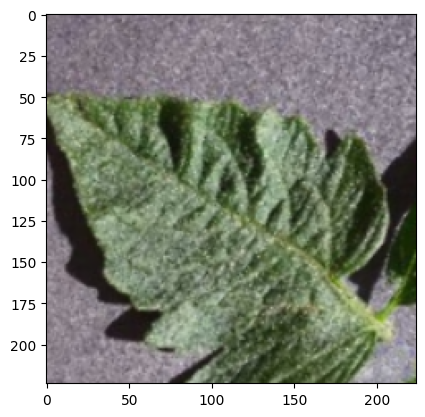

Original Image (Label: 3):


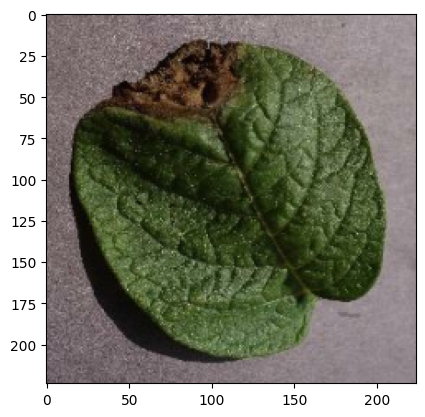

Augmented Image:


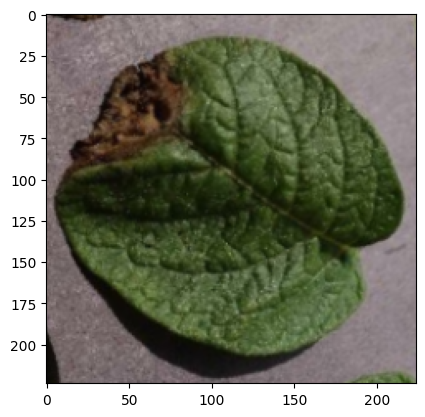

Original Image (Label: 10):


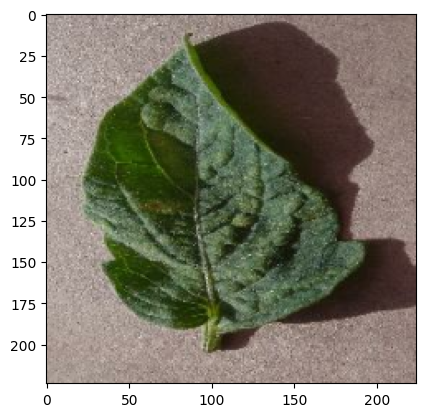

Augmented Image:


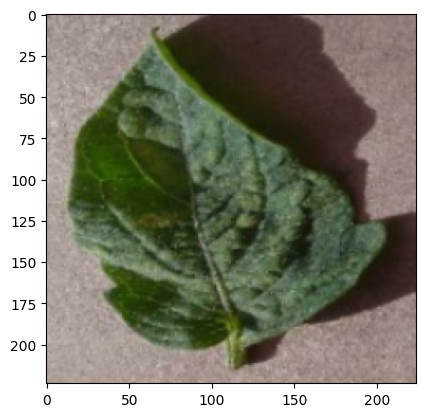

Original Image (Label: 11):


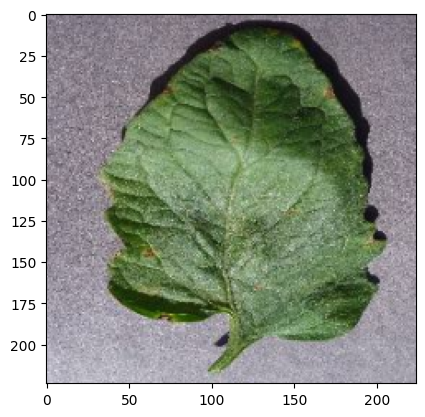

Augmented Image:


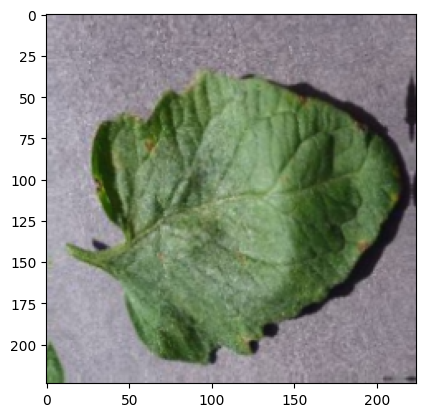

Original Image (Label: 12):


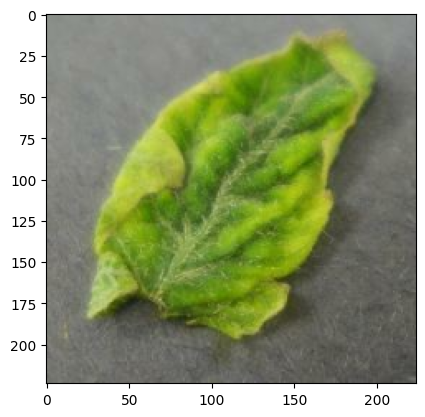

Augmented Image:


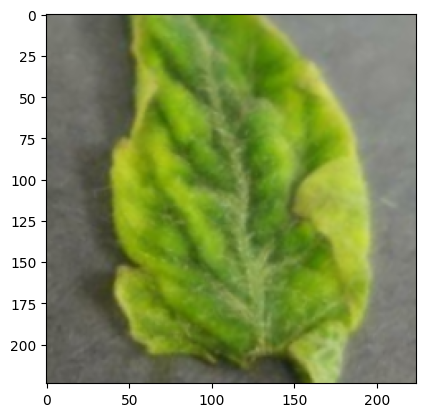

Original Image (Label: 2):


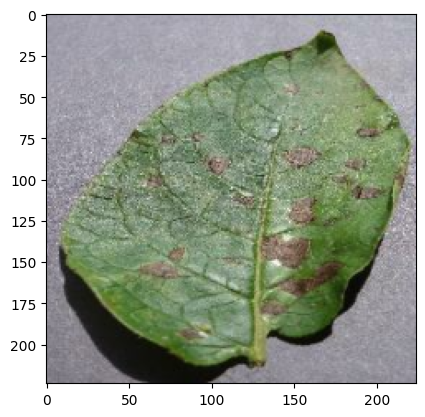

Augmented Image:


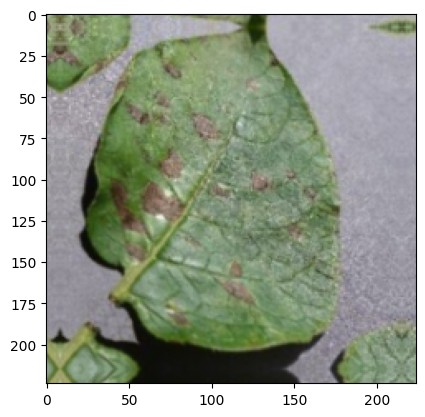

Original Image (Label: 6):


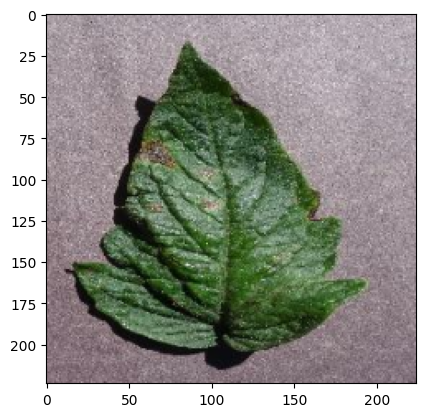

Augmented Image:


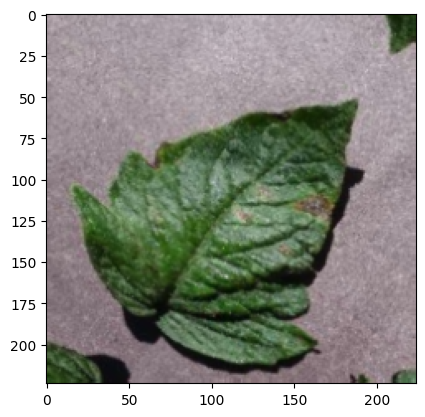

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1792)              4363712   
                                                                 
 dense (Dense)               (None, 15)                26895     
                                                                 
Total params: 4390607 (16.75 MB)
Trainable params: 26895 (105.06 KB)
Non-trainable params: 4363712 (16.65 MB)
_________________________________________________________________


In [7]:
# Load pre-trained Vision Transformer model from TensorFlow Hub
vit_model = "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/feature_vector/4"
pretrained_model = hub.KerasLayer(vit_model, trainable=False)

# Build model
model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Dense(15, activation='softmax')
])

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)



# Add data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2),
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
])






# Compile model
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Build the model
model.build(input_shape=(None, 224, 224, 3))


import numpy as np

# Function to display image with grid divisions
def display_image_with_grid(image):
    plt.imshow(image)
    plt.show()

# Modified training loop to display images
for images, labels in ds_train.take(1):  # Take one batch for demonstration
    augmented_images = data_augmentation(images)  # Apply data augmentation
    for i in range(len(images)):
        original_image = images[i].numpy()  # Convert tensor to numpy array
        augmented_image = augmented_images[i].numpy()  # Convert tensor to numpy array

        print(f"Original Image (Label: {labels[i].numpy()}):")
        display_image_with_grid(original_image)

        print(f"Augmented Image:")
        display_image_with_grid(augmented_image)


# Display model summary
model.summary()


Image size: 224 X 224
Patch size: 32 X 32
Patches per image: 49
Elements per patch: 3072


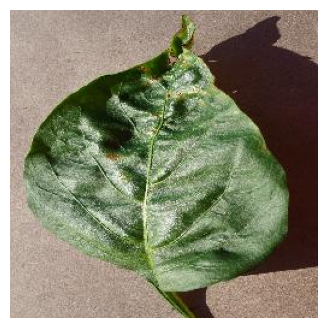

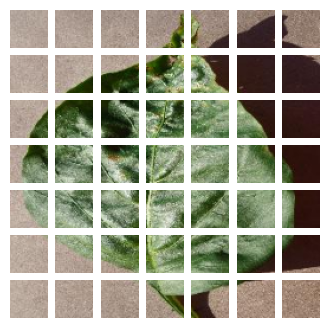

In [22]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

image_size = 224
img_height, img_width = 512, 512
patch_size = 32
num_patches = (image_size // patch_size) ** 2

class Patches(layers.Layer):

    def __init__(self, patch_size):
        super(Patches, self).__init__()
        super(Patches, self).__init__()
        self.patch_size = patch_size
    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches


import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.figure(figsize=(4, 4))

target = "/content/PlantDisease/PlantVillage/Pepper__bell___Bacterial_spot"

random_num = random.choice(os.listdir(target))
image = mpimg.imread("/content/PlantDisease/PlantVillage/Pepper__bell___Bacterial_spot" + "/" + random_num)
plt.imshow(image.astype("uint8"))
plt.axis("off")

resized_image = tf.image.resize(
    tf.convert_to_tensor([image]), size=(image_size, image_size)
)

patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")
n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")

Epoch 1/10
645/645 [==============================] - 45s 57ms/step - loss: 1.3861 - accuracy: 0.6287
Epoch 2/10
645/645 [==============================] - 36s 55ms/step - loss: 0.6360 - accuracy: 0.8468
Epoch 3/10
645/645 [==============================] - 42s 65ms/step - loss: 0.4596 - accuracy: 0.8875
Epoch 4/10
645/645 [==============================] - 36s 55ms/step - loss: 0.3723 - accuracy: 0.9073
Epoch 5/10
645/645 [==============================] - 36s 56ms/step - loss: 0.3179 - accuracy: 0.9199
Epoch 6/10
645/645 [==============================] - 35s 54ms/step - loss: 0.2798 - accuracy: 0.9285
Epoch 7/10
645/645 [==============================] - 35s 55ms/step - loss: 0.2512 - accuracy: 0.9354
Epoch 8/10
645/645 [==============================] - 36s 55ms/step - loss: 0.2288 - accuracy: 0.9403
Epoch 9/10
645/645 [==============================] - 36s 55ms/step - loss: 0.2104 - accuracy: 0.9451
Epoch 10/10
645/645 [==============================] - 36s 55ms/step - loss: 0.195

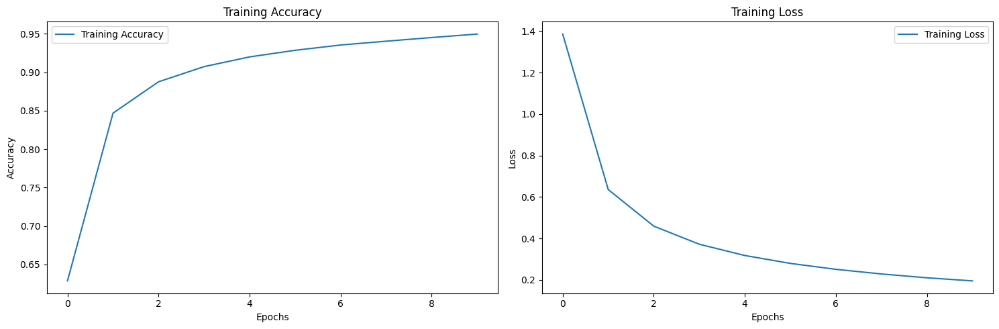

In [8]:
# Define number of epochs
epochs = 10

# Fit the model
history = model.fit(
    ds_train,
    epochs=epochs
)

# Plot training history
plt.figure(figsize=(15, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [9]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Load validation dataset
ds_val = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/PlantDisease/plantvillage/PlantVillage',
    labels='inferred',
    label_mode='int',
    color_mode='rgb',
    batch_size=32,
    image_size=(224, 224),
    shuffle=False,  # Set shuffle to False for validation
)

# Preprocess validation dataset
ds_val = ds_val.map(preprocess_data).prefetch(tf.data.AUTOTUNE)

# Get true labels and predictions
true_labels = []
predicted_labels = []

for images, labels in ds_val:
    predictions = model.predict(images)
    predicted_labels.extend(np.argmax(predictions, axis=1))
    true_labels.extend(labels.numpy())

# Calculate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Calculate classification report
# target_names = [f'Class {i}' for i in range(num_classes)]  # Adjust based on your class names
# Calculate classification report with zero_division=1
# Calculate unique true labels and target names
unique_labels = np.unique(true_labels)
target_names = [f'Class {label}' for label in unique_labels]  # Adjust based on your class names

# Calculate classification report with zero_division=1
cr = classification_report(true_labels, predicted_labels, labels=unique_labels, target_names=target_names, zero_division=1)





Found 20638 files belonging to 15 classes.
1/1 [==============================] - 0s 488ms/step


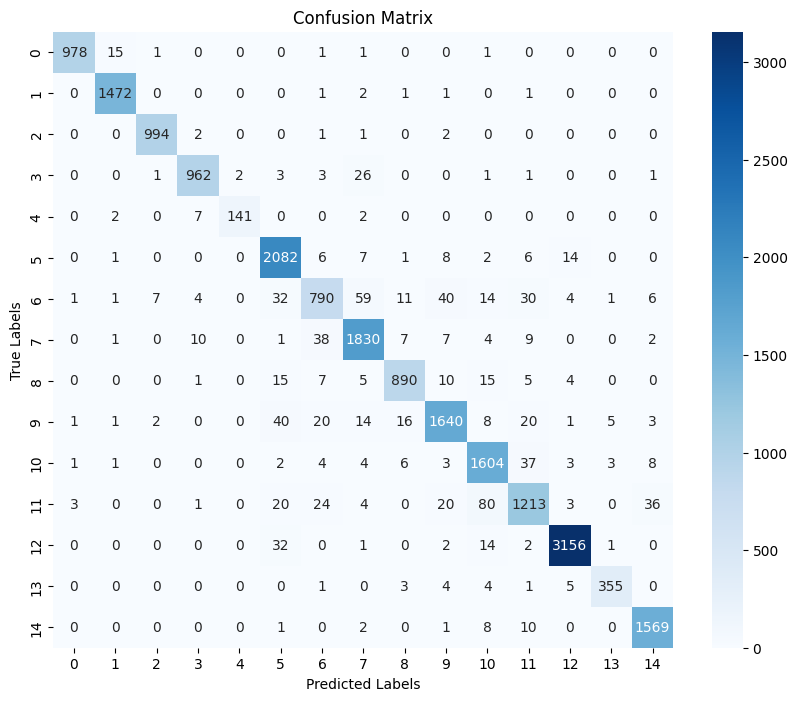


Classification Report:
              precision    recall  f1-score   support

     Class 0       0.99      0.98      0.99       997
     Class 1       0.99      1.00      0.99      1478
     Class 2       0.99      0.99      0.99      1000
     Class 3       0.97      0.96      0.97      1000
     Class 4       0.99      0.93      0.96       152
     Class 5       0.93      0.98      0.96      2127
     Class 6       0.88      0.79      0.83      1000
     Class 7       0.93      0.96      0.95      1909
     Class 8       0.95      0.93      0.94       952
     Class 9       0.94      0.93      0.93      1771
    Class 10       0.91      0.96      0.94      1676
    Class 11       0.91      0.86      0.89      1404
    Class 12       0.99      0.98      0.99      3208
    Class 13       0.97      0.95      0.96       373
    Class 14       0.97      0.99      0.98      1591

    accuracy                           0.95     20638
   macro avg       0.96      0.95      0.95     20638
we

In [10]:
# Calculate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Calculate unique true labels and target names
unique_labels = np.unique(true_labels)
target_names = [f'Class {label}' for label in unique_labels]  # Adjust based on your class names

# Calculate classification report with zero_division=1
cr = classification_report(true_labels, predicted_labels, labels=unique_labels, target_names=target_names, zero_division=1)

# Print confusion matrix and classification report
import matplotlib.pyplot as plt
import seaborn as sns

# Define the labels for the confusion matrix
labels = unique_labels

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()


print("\nClassification Report:")
print(cr)



In [11]:
print("\nClassification Report:")
print(cr)


Classification Report:
              precision    recall  f1-score   support

     Class 0       0.99      0.98      0.99       997
     Class 1       0.99      1.00      0.99      1478
     Class 2       0.99      0.99      0.99      1000
     Class 3       0.97      0.96      0.97      1000
     Class 4       0.99      0.93      0.96       152
     Class 5       0.93      0.98      0.96      2127
     Class 6       0.88      0.79      0.83      1000
     Class 7       0.93      0.96      0.95      1909
     Class 8       0.95      0.93      0.94       952
     Class 9       0.94      0.93      0.93      1771
    Class 10       0.91      0.96      0.94      1676
    Class 11       0.91      0.86      0.89      1404
    Class 12       0.99      0.98      0.99      3208
    Class 13       0.97      0.95      0.96       373
    Class 14       0.97      0.99      0.98      1591

    accuracy                           0.95     20638
   macro avg       0.96      0.95      0.95     20638
we